### <u><div style="text-align: center"> <h1>Python Portfolio Project</h1></div></u>
### <u><div style="text-align: center"> <h1> 120 Years of Olympics Data</h1></div></u>

###### <div style="text-align: right"> <h1> Presented by Guillaume Dado </h1></div>

# <u> Business Questions </u>

### - Details about the youngest and oldest athletes of all time
### - Relationship between athlete Ages and Medals Won
### - Age range that won the most medals along with the total number of medal won
### - Top 10 cities that hosted the most olympic Game
### - Top ten (10) countries with the most paricipant (Athletes)
### - Top 10 countries having the most medals
### - Male/Female participation ratio in the Olympic Games from 1896 to 2016
### - Correlation between weight and height of the athletes per sport 

In [101]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Loading the datasets

In [102]:
df_athlete = pd.read_csv('C:/Users/Asus/Documents/NEW Apprenticeship/Python Portfolio Project/Dataset/athlete_events.csv')
df_region = pd.read_csv('C:/Users/Asus/Documents/NEW Apprenticeship/Python Portfolio Project//noc_regions.csv')

### Glance at the datasets (Top 5)

In [103]:
df_athlete.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


In [104]:
df_athlete.shape

(271116, 15)

In [105]:
df_region.head()

,NOC,region,notes
0,AFG,Afghanistan,NaN
1,AHO,Curacao,Netherlands Antilles
2,ALB,Albania,NaN
3,ALG,Algeria,NaN
4,AND,Andorra,NaN


In [106]:
df_region.shape

(230, 3)

In [107]:
df_athlete.isnull().sum() 

ID             0
Name           0
Sex            0
Age         9474
Height     60171
Weight     62875
Team           0
NOC            0
Games          0
Year           0
Season         0
City           0
Sport          0
Event          0
Medal     231333
dtype: int64

### Replacing the null values in the columns Age, Height, and Weight by their respective mean and "No Medal" in the column Medal 

In [108]:
df_athlete['Age'].fillna((df_athlete['Age'].mean()), inplace = True)
df_athlete['Height'].fillna((df_athlete['Height'].mean()), inplace = True)
df_athlete['Weight'].fillna((df_athlete['Weight'].mean()), inplace = True)


In [109]:
df_athlete['Medal'].fillna('Lost', inplace = True)

In [110]:
df_athlete.isnull().sum()

ID        0
Name      0
Sex       0
Age       0
Height    0
Weight    0
Team      0
NOC       0
Games     0
Year      0
Season    0
City      0
Sport     0
Event     0
Medal     0
dtype: int64

### finding and removing duplicates values in the Athlete dataset 

In [111]:
df_athlete.duplicated().sum()

1385

In [139]:
df_athlete.drop_duplicates(inplace=True)

# Check with
df_athlete.duplicated().sum()

0

### Finding nulls and duplicates values in the Region datasets

In [114]:
df_region.isnull().sum()

NOC         0
region      3
notes     209
dtype: int64

In [115]:
df_region.duplicated().sum()

0

### We do have 'NA' values in 3 regions.
### One of rows has NOC (National Olympic commitee) as TUV which is the Island of 'Tuvalu'. However the region shows 'NA'. We will then replace it by the right value.
### One record is saved as unknown that we will just drop.
### The last one is recordered as ROT (Refugee Olympic Team). Since it is note a country, we will also drop that very column. Finally, we will get ride of the column 'notes' since we won't need it for or analysis
### Region dataset has no duplicate value.

In [116]:
df_region.loc[df_region['NOC'] == 'TUV', 'region'] = df_region.loc[df_region['NOC'] == 'TUV', 'region'].fillna('Tuvalu')
df_region = df_region[~df_region['NOC'].isin(['UNK', 'ROT'])]
del df_region['notes']

# Check with:
df_region.isnull().sum()


NOC       0
region    0
dtype: int64

In [117]:
df_region.shape

(228, 2)

### Joining our datasets df_athlete and df_region

In [118]:
df = df_athlete.merge(df_region, how = 'left', on = 'NOC')

### Check the new shape of my joined dataset as well as the columns names

In [119]:
df.shape

(269731, 16)

In [120]:
df.columns

Index(['ID', 'Name', 'Sex', 'Age', 'Height', 'Weight', 'Team', 'NOC', 'Games',
       'Year', 'Season', 'City', 'Sport', 'Event', 'Medal', 'region'],
      dtype='object')

### Let rename the column 'region' into 'Region' to harmonize all the column names. 

In [121]:
df.rename(columns={'region':'Region'}, inplace = 'True')

#check with:
df.columns

Index(['ID', 'Name', 'Sex', 'Age', 'Height', 'Weight', 'Team', 'NOC', 'Games',
       'Year', 'Season', 'City', 'Sport', 'Event', 'Medal', 'Region'],
      dtype='object')

In [122]:
df.describe()

,ID,Age,Height,Weight,Year
count,269731.000000,269731.000000,269731.000000,269731.000000,269731.000000
mean,68264.949591,25.458303,175.338957,70.701918,1978.623073
std,39026.253843,6.056530,9.301313,12.606697,29.752055
min,1.000000,10.000000,127.000000,25.000000,1896.000000
25%,34655.500000,22.000000,170.000000,63.000000,1960.000000
50%,68233.000000,25.000000,175.338970,70.702393,1988.000000
75%,102111.000000,28.000000,180.000000,76.000000,2002.000000
max,135571.000000,97.000000,226.000000,214.000000,2016.000000


### We notice that the youngest and oldest athletes were respectively 10 and 97 years old. Let find more details about them.

In [123]:
youngest_athlete = df.loc[df['Age'].idxmin()]
oldest_athlete = df.loc[df['Age'].idxmax()]
print("Youngest Athlete:")
print(youngest_athlete)

print("\nOldest Athlete:")
print(oldest_athlete)

Youngest Athlete:
ID                                        71691
Name                         Dimitrios Loundras
Sex                                           M
Age                                        10.0
Height                                175.33897
Weight                                70.702393
Team              Ethnikos Gymnastikos Syllogos
NOC                                         GRE
Games                               1896 Summer
Year                                       1896
Season                                   Summer
City                                     Athina
Sport                                Gymnastics
Event     Gymnastics Men's Parallel Bars, Teams
Medal                                    Bronze
Region                                   Greece
Name: 142104, dtype: object

Oldest Athlete:
ID                                             128719
Name                           John Quincy Adams Ward
Sex                                                 M
Age    

### The youngest athlete of all time won a medal whereas the oldest did not.
### This rise the question of the relationship between athlete ages and medals won in the Olympic Games.
### Let find out by creating a scatter plot showing the relationship between age and the number of medals won.


### To accomplish that, let make sure we compte only medals won and not . For that, let create a new dataset that records only columns with medals won (Gold, Bronze and Silver).

In [124]:
selected_medals = ['Gold', 'Bronze', 'Silver']
df_medal = df[df['Medal'].isin(selected_medals)]
df_medal.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,Region
3,4,Edgar Lindenau Aabye,M,34.0,175.33897,70.702393,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark
37,15,Arvo Ossian Aaltonen,M,30.0,175.33897,70.702393,Finland,FIN,1920 Summer,1920,Summer,Antwerpen,Swimming,Swimming Men's 200 metres Breaststroke,Bronze,Finland
38,15,Arvo Ossian Aaltonen,M,30.0,175.33897,70.702393,Finland,FIN,1920 Summer,1920,Summer,Antwerpen,Swimming,Swimming Men's 400 metres Breaststroke,Bronze,Finland
40,16,Juhamatti Tapio Aaltonen,M,28.0,184.00000,85.000000,Finland,FIN,2014 Winter,2014,Winter,Sochi,Ice Hockey,Ice Hockey Men's Ice Hockey,Bronze,Finland
41,17,Paavo Johannes Aaltonen,M,28.0,175.00000,64.000000,Finland,FIN,1948 Summer,1948,Summer,London,Gymnastics,Gymnastics Men's Individual All-Around,Bronze,Finland


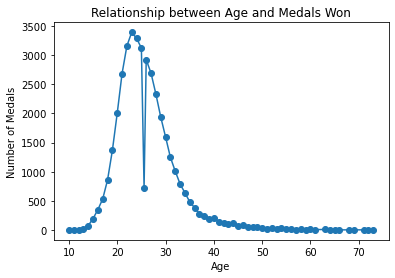

In [125]:
relevant_columns = ['Age', 'Medal']
df1 = df_medal[relevant_columns]

# Group the data by age and calculate the total number of medals won
grouped_data = df_medal.groupby('Age').size()

# Plot the relationship between age and the number of medals won
plt.plot(grouped_data.index, grouped_data.values, marker='o')
plt.xlabel('Age')
plt.ylabel('Number of Medals')
plt.title('Relationship between Age and Medals Won')
plt.show()

### Let find out the exact age that won the most medals along with the total number of medal won

In [126]:
grouped_data = df_medal.groupby('Age')['Medal'].value_counts().unstack()

# Find the age group with the maximum total number of medals won
max_medals_age = grouped_data.sum(axis=1).idxmax()

# Calculate the total number of medals won
total_medals = grouped_data.sum().sum()

# Print the age group that won the most medals and the total number of medals
print("The age group that won the most medals is:", max_medals_age)
print("The total number of medals won is:", total_medals)

The age group that won the most medals is: 23.0
The total number of medals won is: 39772.0


### Let find the top 10 cities that hosted the most olympic Game.

In [127]:
City = df.groupby('City').apply(lambda x:x['Year'].unique()).to_frame().reset_index()
City.columns = ['City','Years']
City['Occurence']=[len(c) for c in City['Years']]
City.sort_values('Occurence', ascending = False).head(10)
                                                     

,City,Years,Occurence
3,Athina,"[2004, 1906, 1896]",3
17,London,"[2012, 1948, 1908]",3
30,Sankt Moritz,"[1928, 1948]",2
26,Paris,"[1900, 1924]",2
37,Stockholm,"[1912, 1956]",2
18,Los Angeles,"[1932, 1984]",2
15,Lake Placid,"[1980, 1932]",2
14,Innsbruck,"[1964, 1976]",2
0,Albertville,[1992],1
27,Rio de Janeiro,[2016],1


### Male and female participation at the Olympic Games

In [128]:
print('Total number of athletes from 1896 to 2016: ', len(df.ID))
print('Total number of male participants from 1896 to 2016: ', len(df[df.Sex=='M']))
print('Total number of female participants from 1896 to 2016: ', len(df[df.Sex=='F']))

Total number of athletes from 1896 to 2016:  269731
Total number of male participants from 1896 to 2016:  195353
Total number of female participants from 1896 to 2016:  74378


### Top ten (10) countries with the most paricipant (Athletes)

In [129]:
top_10_countries = df.Team.value_counts().sort_values(ascending = False).head(10)
top_10_countries

United States    17598
France           11817
Great Britain    11264
Italy            10213
Germany           9230
Canada            9226
Japan             8269
Sweden            8004
Australia         7512
Hungary           6492
Name: Team, dtype: int64

#### How does the above look like  visualy

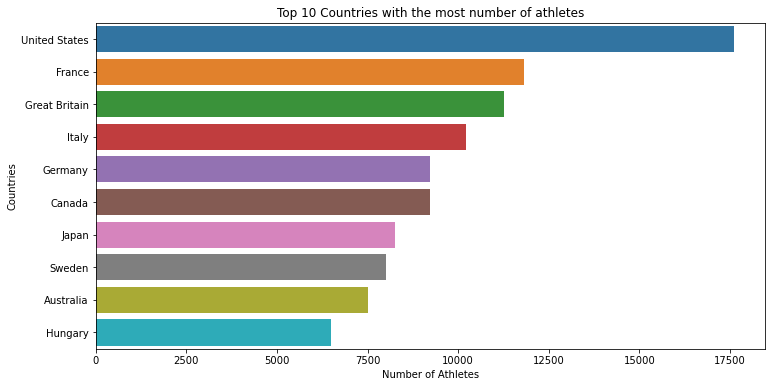

In [130]:
plt.figure(figsize=(12,6))
sns.barplot(x=top_10_countries, y=top_10_countries.index)
plt.title('Top 10 Countries with the most number of athletes')
plt.xlabel('Number of Athletes')
plt.ylabel("Countries")
plt.show()

### Top 10 countries having the most medals

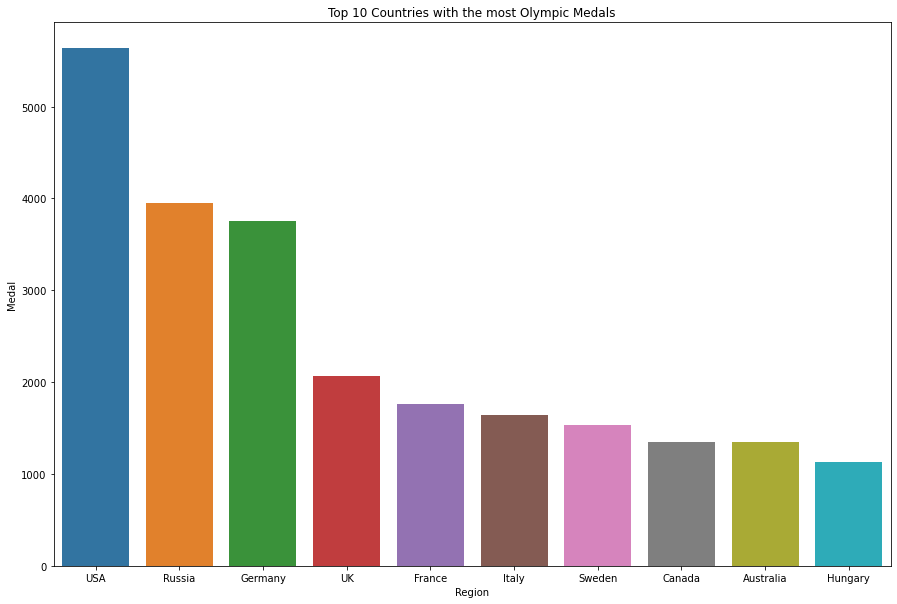

In [131]:
plt.figure(figsize=(15,10))
top_10_countries = df_medal.groupby('Region')['Medal'].count().nlargest(10).reset_index()
sns.barplot(x='Region', y='Medal', data=top_10_countries)
plt.title('Top 10 Countries with the most Olympic Medals')
plt.show()

In [132]:
# Number of medal won by the USA 
USA = df_medal[(df_medal['Region']=='USA')]
medals =USA['Medal'].value_counts()
medals

Gold      2638
Silver    1641
Bronze    1358
Name: Medal, dtype: int64

In [133]:
CIV = df[(df['Region']=='Ivory Coast')]
medals =CIV['Medal'].value_counts()
medals

Lost      190
Gold        1
Bronze      1
Silver      1
Name: Medal, dtype: int64

### Male/Female participation ratio in the Olympic Game from 1896 to 2016

In [134]:
Year = np.arange(1896, 2017,4).tolist()
for i in Year:

    total_count = df.Sex.count()
    male_count = df['Sex'][df.Sex=='M'][df.Year>i].count()
    female_count = df['Sex'][df.Sex=='F'][df.Year>i].count()
    male_ratio = int((male_count/total_count)*100)
    female_ratio = int((female_count/total_count)*100)
    gap = int(male_ratio - female_ratio)
    try:
        venue = df.City[df.Year == i].unique()[0]
    except:
        venue = "Unknown"
    
    print(f"Male-Femal ration in {venue}({i}) is {male_ratio}:{female_ratio} and the gap is {gap}")

Male-Femal ration in Athina(1896) is 72:27 and the gap is 45
Male-Femal ration in Paris(1900) is 71:27 and the gap is 44
Male-Femal ration in St. Louis(1904) is 71:27 and the gap is 44
Male-Femal ration in London(1908) is 69:27 and the gap is 42
Male-Femal ration in Stockholm(1912) is 67:27 and the gap is 40
Male-Femal ration in Unknown(1916) is 67:27 and the gap is 40
Male-Femal ration in Antwerpen(1920) is 66:27 and the gap is 39
Male-Femal ration in Paris(1924) is 64:27 and the gap is 37
Male-Femal ration in Amsterdam(1928) is 62:27 and the gap is 35
Male-Femal ration in Los Angeles(1932) is 61:27 and the gap is 34
Male-Femal ration in Berlin(1936) is 59:26 and the gap is 33
Male-Femal ration in Unknown(1940) is 59:26 and the gap is 33
Male-Femal ration in Unknown(1944) is 59:26 and the gap is 33
Male-Femal ration in London(1948) is 56:26 and the gap is 30
Male-Femal ration in Helsinki(1952) is 53:26 and the gap is 27
Male-Femal ration in Cortina d'Ampezzo(1956) is 51:25 and the gap

### How does the above ratio look like from the graphical standpoint?

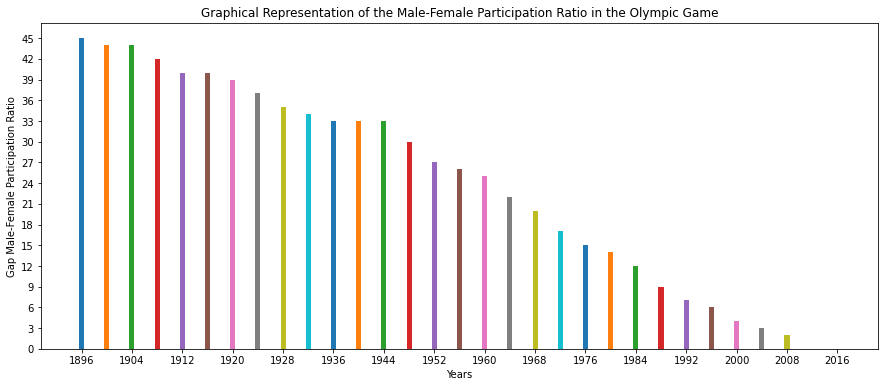

In [135]:
plt.figure(figsize=(15,6))
plt.title("Graphical Representation of the Male-Female Participation Ratio in the Olympic Game")
plt.xlabel("Years")
plt.ylabel("Gap Male-Female Participation Ratio")
plt.yticks(np.arange(0,50,3))
plt.xticks(np.arange(1896,2018,8))
for i in Year:

    total_count = df.Sex.count()
    male_count = df['Sex'][df.Sex=='M'][df.Year>i].count()
    female_count = df['Sex'][df.Sex=='F'][df.Year>i].count()
    male_ratio = int((male_count/total_count)*100)
    female_ratio = int((female_count/total_count)*100)
    gap = int(male_ratio - female_ratio)
    
    plt.bar(i,gap)
plt.show()

### Correlation between weight and height of the athletes

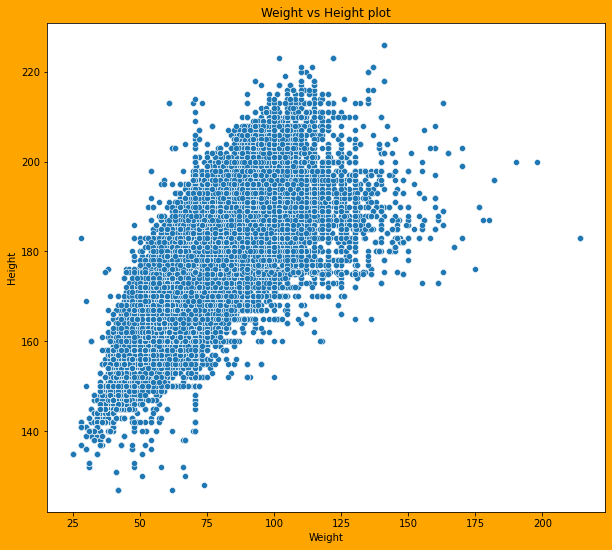

In [136]:
plt.figure(figsize=(10,9),facecolor='orange')
sns.scatterplot(x=df['Weight'], y=df['Height'])
plt.title("Weight vs Height plot")
plt.show()

### Correlation between weight and height of the athletes per sport

In [137]:
!python.exe -m pip install --upgrade pip

In [141]:
# !pip install plotly
import plotly.express as px
fig = px.scatter(df, x="Weight", y="Height", color="Sport")
fig.update_layout(title = "Distribution of weight and height per sport")
fig.show()